In [1]:
### Import libraries

%matplotlib inline
import xarray as xr
import cmocean as cmo

import numpy as np
import numpy.ma as ma

import matplotlib.pyplot as plt
import matplotlib.path as mpath
import matplotlib.ticker as mticker
from matplotlib.gridspec import GridSpec, GridSpecFromSubplotSpec
import matplotlib.animation
from matplotlib.animation import FuncAnimation

from IPython.display import HTML
from datetime import timedelta as delta

import cartopy
import cartopy.crs as ccrs

import warnings
from shapely.errors import ShapelyDeprecationWarning
warnings.filterwarnings("ignore", category=ShapelyDeprecationWarning)
warnings.filterwarnings("ignore", message="All-NaN slice encountered", category=RuntimeWarning)

# General settings and preparation

In [2]:
### Define functions for preparation of data and plotting

def divide_longitude(lons, lats, var):
    '''
    Split data into sections east and west of the prime meridian.
    
    Parameters:
    ---
    lons (array): longitudes
    lats (array): latitudes
    var (array): variable data associated with the latitudes and longitudes
        
    Returns:
    ---
    lons_greater (array): longitudes east of the prime meridian (0 to 180°)
    lons_lesser (array): longitudes west of the prime meridian (-180 to 0°)
    lats_greater (array): latitudes corresponding to lons_greater
    lats_lesser (array): latitudes corresponding to lons_lesser
    var_greater (array): variable data corresponding to lons_greater
    var_lesser (array): variable data corresponding to lons_lesser
    '''
    
    # Mask based on longitudes
    lons_greater = ma.masked_greater(lons, -0.01)
    lons_lesser = ma.masked_less(lons, 0.)
    
    lats_greater = ma.MaskedArray(lats, mask=lons_greater.mask)
    lats_lesser = ma.MaskedArray(lats, mask=lons_lesser.mask)
    
    var_greater = ma.MaskedArray(var, mask=lons_greater.mask)
    var_lesser = ma.MaskedArray(var, mask=lons_lesser.mask)
    
    return lons_greater, lons_lesser, lats_greater, lats_lesser, var_greater, var_lesser

In [3]:
### Base path to files
base_path = '/nethome/5867800/'

In [4]:
### Locations

# ODP Site 696
x696_le, y696_le = -57., -67.5              # late Eocene coordinates (determined visually) [°]

# Gridcell distance
gcd = (np.deg2rad(0.1)*6371e3)              # gridcell distance [m]

In [5]:
### Prepare bathymetric data

# Load data Nooteboom et al. (2022)
topo = xr.open_dataset(base_path + 'grid/adapted_bathymetry.nc')

# Load latitudes, longitudes and bathymetry
lonsg, lonsl, latsg, latsl, varg, varl = divide_longitude(topo.variables['T_LON_2D'][:,:], topo.variables['T_LAT_2D'][:,:], topo.variables['Bathymetry'][:,:])
lons = np.concatenate((lonsg[:,2650:], lonsg[:,:850], lonsl[:,850:2650]), axis=1)   # -179.95 to -85.05, -84.95 to -0.05, 0.05 to 179.95
lats = np.concatenate((latsg[:,2650:], latsg[:,:850], latsl[:,850:2650]), axis=1)
bath = np.concatenate((varg[:,2650:], varg[:,:850], varl[:,850:2650]), axis=1)

# Animation

## Prepare data

Analyse trajectories for icebergs of size class C4. Select those that reach ODP Site 696 at some point along their trajectory.

In [6]:
### Load data
C4g = xr.open_zarr(base_path + 'active/29p_5y_int_30d_1hdtar_C4g.zarr')   # grounding, C4 (L=10000m)

### Select trajectories within range of ODP Site 696
min_distances = C4g['distance'][:,:].groupby('trajectory').min(dim='obs')
filtered_ds = C4g.where(min_distances <= gcd, drop=True)

(animation for one or eight icebergs)

In [7]:
### Select iceberg trajectory
IBs = filtered_ds.isel(trajectory=slice(143,144))

outputdt = delta(days=30)
timerange = np.arange(np.nanmin(IBs['time'].values),
                      np.nanmax(IBs['time'].values), 
                      outputdt)  # timerange in nanoseconds

time_id = np.where(IBs['time'] == timerange[0]) # Indices of the data where time = 0

Load forcing model (background) data.

In [8]:
### Eocene model data Nooteboom et al. (2022)
data_path_ocean = '/storage/shared/pop/p21a.EO38Ma.tx0.1.2pic_control/daily/'
mesh_mask = base_path + 'grid/edited_grid_coordinates_pop_tx0.1_38ma.nc'

grid = xr.open_dataset(mesh_mask)

## Animate selected iceberg trajectories

/tmp/ipykernel_4972/1498891327.py:90: UserWarning: FixedFormatter should only be used together with FixedLocator
  m_ax.set_xticklabels(['39-01','39-05','39-09','40-01','40-05','40-09','41-01','40-05','40-09','42-01'])


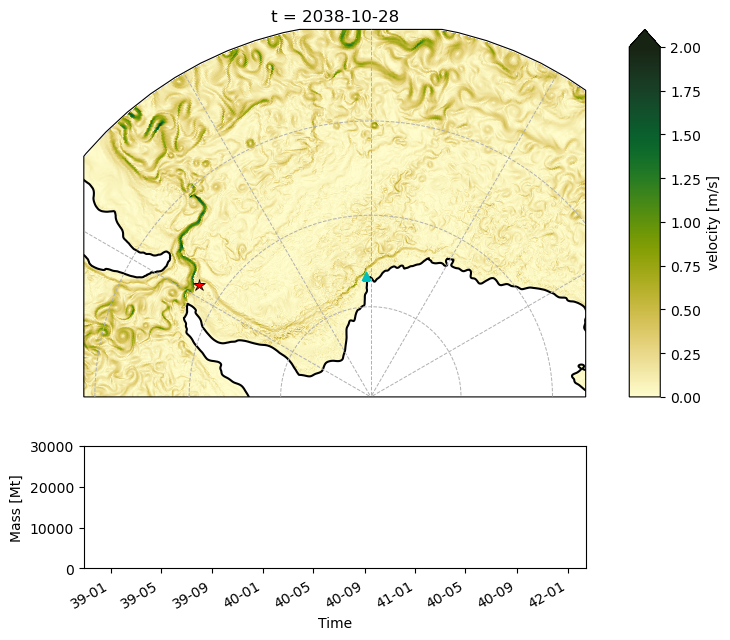

In [9]:
### Animation figure

### Prepare axes
fig = plt.figure(figsize=(8,7))

gs = GridSpec(2, 1, height_ratios=[3,1])                                                             # figure: 2 roww, 1 column
gs0 = GridSpecFromSubplotSpec(1, 2, subplot_spec=gs[0], wspace=0.0, width_ratios=(19, 1))            # top row: 1 row, 2 columns
gs1 = GridSpecFromSubplotSpec(1, 3, subplot_spec=gs[1], wspace=0.0, width_ratios=(1.4, 16.2, 2.4))   # bottom row: 1 row, 3 columns

ax = fig.add_subplot(gs0[0,0], projection=ccrs.SouthPolarStereo())
cb_ax = fig.add_subplot(gs0[0,1])
m_ax = fig.add_subplot(gs1[0,1])

# Adapt border
ax.set_extent([-50, 35, -90, -50], ccrs.PlateCarree())
ylim = [-90,-50]
xlim = [-90,90]
rect = mpath.Path([[xlim[0], ylim[0]],
                   [xlim[1], ylim[0]],
                   [xlim[1], ylim[1]],
                   [xlim[0], ylim[1]],
                   [xlim[0], ylim[0]],
                   ]).interpolated(40)
proj_to_data   = ccrs.PlateCarree()._as_mpl_transform(ax) - ax.transData
rect_in_target = proj_to_data.transform_path(rect)
ax.set_boundary(rect_in_target)

# ODP Site 696
ax.plot(x696_le, y696_le, color='r', marker='*', markersize=9, markeredgecolor='black', markeredgewidth=.5,
        transform=ccrs.PlateCarree(), zorder=3)

# Coastlines
ax.contour(lons[:760,850:2700], lats[:760,850:2700], bath[:760,850:2700], levels=[0],
           transform=ccrs.PlateCarree(), colors='k', zorder=2)
ax.contourf(lons[:760,850:2700], lats[:760,850:2700], bath[:760,850:2700], levels=[0, 1e10],   # colour land white
            transform=ccrs.PlateCarree(), colors=['white'], zorder=1)
ax.scatter(1, -78.4, transform=ccrs.PlateCarree(), color='white', zorder=3, s=40)

# Gridlines
# -60, -30, 0, 30, 60 W/E (only lines)
gl0 = ax.gridlines(linestyle='--', linewidth=.7, draw_labels=False, x_inline=False, y_inline=False,
                   crs=ccrs.PlateCarree(), zorder=5)
gl0.xlocator = mticker.FixedLocator(np.arange(-60,61,30))
gl0.ylocator = mticker.FixedLocator([])
# 90, 80, 70, 60 S (only lines)
gl1 = ax.gridlines(linestyle='--', linewidth=.7, draw_labels=False, x_inline=False, y_inline=False,
                   crs=ccrs.PlateCarree(), zorder=5)
gl1.xlocator = mticker.FixedLocator([])
gl1.ylocator = mticker.FixedLocator(np.arange(-90,-59,10))
# 50 S (only lines)
gl2 = ax.gridlines(linestyle='-', linewidth=1, color='k', draw_labels=False, x_inline=False, y_inline=False,
                   crs=ccrs.PlateCarree(), zorder=5)
gl2.xlocator = mticker.FixedLocator([])
gl2.ylocator = mticker.FixedLocator(np.arange(-50,-49,10))


### Background (ocean velocity)
tm = str(IBs['time'].values[0,0])[2:4] + str(IBs['time'].values[0,0])[5:7] + str(IBs['time'].values[0,0])[8:10]
ds = xr.open_dataset(f'/storage/shared/pop/p21a.EO38Ma.tx0.1.2pic_control/daily/vars_first600m_eocene_2pic_pop_00{tm}.nc')
data = np.sqrt((ds['UVEL'][0,0,:750,:])**2 + (ds['VVEL'][0,0,:750,:])**2) / 100.
kw = dict(cmap=cmo.cm.speed, vmin=0, vmax=2, shading='flat')

cm = ax.pcolormesh(grid['U_LON_2D'][:750,:], grid['U_LAT_2D'][:750,:], data[:-1,:-1], transform=ccrs.PlateCarree(), **kw, zorder=0)


### Iceberg position
scatter = ax.scatter(IBs['lon'].values[time_id], IBs['lat'].values[time_id],
                     transform=ccrs.PlateCarree(), marker='^', color='c', zorder=2)
### Iceberg trajectory
traj, = ax.plot(IBs['lon'].values[time_id], IBs['lat'].values[time_id],
                     transform=ccrs.PlateCarree(), color='darkcyan', zorder=1)

t = str(timerange[0].astype('datetime64[D]'))
title = ax.set_title('t = '+t)


#=================================================================================================#
### Colorbar (right)
fig.colorbar(cm, cax=cb_ax, orientation='vertical', label=r'velocity [m/s]', extend='max')


#=================================================================================================#
### Mass (bottom)
mass, = m_ax.plot(IBs['time'].values[time_id], IBs['M'].values[time_id]*1e-9,
                     color='darkcyan')
m_ax.set_ylim(0,30000)
m_ax.set_ylabel('Mass [Mt]')
m_ax.set_xlim(np.nanmin(IBs['time'].values), np.nanmax(IBs['time'].values))
m_ax.set_xlabel('Time')
m_ax.set_xticklabels(['39-01','39-05','39-09','40-01','40-05','40-09','41-01','40-05','40-09','42-01'])
for label in m_ax.get_xticklabels(which='major'):
    label.set(rotation=30, horizontalalignment='right')


#=================================================================================================#
### Animation function
def animate(i):
    t = str(timerange[i].astype('datetime64[D]'))
    title.set_text('t = '+t)
    
    time_id = np.where(IBs['time'] == timerange[i])
    
    tm = str(IBs['time'].values[0,i])[2:4] + str(IBs['time'].values[0,i])[5:7] + str(IBs['time'].values[0,0])[8:10]
    ds = xr.open_dataset(f'/storage/shared/pop/p21a.EO38Ma.tx0.1.2pic_control/daily/vars_first600m_eocene_2pic_pop_00{tm}.nc')
    data = np.sqrt((ds['UVEL'][0,0,:750,:])**2 + (ds['VVEL'][0,0,:750,:])**2) / 100.
    cm.set_array(data[:-1,:-1])
    
    scatter.set_offsets(np.c_[IBs['lon'].values[time_id], IBs['lat'].values[time_id]])
    traj.set_data(IBs['lon'].values[:,:i+1], IBs['lat'].values[:,:i+1])
    
    # Mass
    mass.set_data(IBs['time'].values[:,:i+1], IBs['M'].values[:,:i+1]*1e-9)

anim = FuncAnimation(fig, animate, frames = len(timerange), interval=750)

In [10]:
HTML(anim.to_jshtml())

In [11]:
f = r'/nethome/5867800/active/EoceneIcebergTracing_Animation.mp4'
writervideo = matplotlib.animation.FFMpegWriter(fps=12)
anim.save(f, writer=writervideo, dpi=300)